# Plot SASSIE-ECCO model granules from the cloud

In [1]:
## import required packages
import numpy as np
import pandas as pd
import sys
import xarray as xr
import matplotlib.pyplot as plt
import glob
import warnings
from pathlib import Path
import s3fs
from pprint import pprint
import matplotlib
from matplotlib.backends.backend_pdf import PdfPages

In [2]:
## 39 2D fields
## 28 3D fields

fields_all = [
    "ETAN",
    "PHIBOT",
    "sIceLoad",
    "KPPhbl",
    "EXFaqh",
    "EXFatemp",
    "EXFempmr",
    "EXFevap",
    "EXFpreci",
    "EXFroff",
    "EXFqnet",
    "EXFhl",
    "EXFhs",
    "EXFlwdn",
    "EXFlwnet",
    "EXFswdn",
    "EXFswnet",
    "EXFuwind",
    "EXFtaux",
    "EXFvwind",
    "EXFtauy",
    "oceFWflx",
    "oceQnet",
    "oceQsw",
    "oceTAUX",
    "oceTAUY",
    "SFLUX",
    "TFLUX",
    "SIatmFW",
    "SIatmQnt",
    "SIarea",
    "SIheff",
    "SIhsnow",
    "SIuice",
    "SIvice",
    "ADVxHEFF",
    "ADVxSNOW",
    "ADVyHEFF",
    "ADVySNOW",
    "THETA",
    "SALT",
    "UVEL",
    "VVEL",
    "WVEL",
    "KPPdiffS",
    "KPPdiffT",
    "KPPviscA",
    "PHIHYD",
    "PHIHYDcR",
    "RHOAnoma",
    "ADVr_SLT",
    "ADVr_TH",
    "ADVx_SLT",
    "ADVx_TH",
    "ADVy_SLT",
    "ADVy_TH",
    "DFrE_SLT",
    "DFrE_TH",
    "DFrI_SLT",
    "DFrI_TH",
    "DFxE_SLT",
    "DFxE_TH",
    "DFyE_SLT",
    "DFyE_TH",
    "UVELMASS",
    "VVELMASS",
    "WVELMASS"
]

In [9]:
def plot_ecco_HH_granule_2D(var, winter_ds, summer_ds, vrange_same, cmap='jet'):
    """
    Plots 2D sassie-ecco HH granules for one winter and summer example
    """
    
    ## set colorbar range
    if vrange_same: # if it is specified for both plots to have the same colobar range
        vmin_winter = np.mean([winter_ds[var].min().values, summer_ds[var].min().values])
        vmax_winter = np.mean([winter_ds[var].max().values, summer_ds[var].max().values])
        
        vmin_summer = np.mean([winter_ds[var].min().values, summer_ds[var].min().values])
        vmax_summer = np.mean([winter_ds[var].max().values, summer_ds[var].max().values])
        
    else:
        vmin_winter = np.min(winter_ds[var])
        vmax_winter = np.max(winter_ds[var])
   
        vmin_summer = np.min(summer_ds[var])
        vmax_summer = np.max(summer_ds[var])
        
    ## plot examples
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=[14,4])
    fig.tight_layout(w_pad=10)   

    winter_ds[var].isel(time=0).plot(vmin=vmin_winter, vmax=vmax_winter, cmap=cmap, ax=ax1)
    summer_ds[var].isel(time=0).plot(vmin=vmin_summer, vmax=vmax_summer, cmap=cmap, ax=ax2)
        
    ax1.set_facecolor('lightgray')
    ax2.set_facecolor('lightgray')
        
    ## add titles
    ax1.set_title(f"WINTER\n{str(winter_ds.time.values)[2:12]}")
    ax2.set_title(f"SUMMER\n{str(summer_ds.time.values)[2:12]}")
    fig.suptitle(f"{var} - 2D", fontweight='bold', y=1.07);
    
    plt.show()

In [10]:
def plot_ecco_HH_granule_3D(var, winter_ds, summer_ds, vrange_same, depth_3d=0, cmap='jet'):
    """
    Plots 3D sassie-ecco HH granules for one winter and summer example
    """
    
    ## select only depth you want
    winter_slice = winter_ds.swap_dims({"k":"Z"}).sel(Z=depth_3d, method='nearest')
    summer_slice = summer_ds.swap_dims({"k":"Z"}).sel(Z=depth_3d, method='nearest')
    
    ## set colorbar range
    if vrange_same: # if it is specified for both plots to have the same colobar range
        vmin_winter = np.mean([winter_slice[var].min().values, summer_slice[var].min().values])
        vmax_winter = np.mean([winter_slice[var].max().values, summer_slice[var].max().values])
        
        vmin_summer = np.mean([winter_slice[var].min().values, summer_slice[var].min().values])
        vmax_summer = np.mean([winter_slice[var].max().values, summer_slice[var].max().values])
        
    else:
        vmin_winter = np.min(winter_slice)
        vmax_winter = np.max(winter_slice)
   
        vmin_summer = np.min(summer_slice)
        vmax_summer = np.max(summer_slice)
        
    ## plot examples
    fig, (ax1,ax2) = plt.subplots(1,2, figsize=[14,4])
    fig.tight_layout(w_pad=10)   

    winter_slice[var].isel(time=0).plot(vmin=vmin_winter, vmax=vmax_winter, cmap=cmap, ax=ax1)
    summer_slice[var].isel(time=0).plot(vmin=vmin_summer, vmax=vmax_summer, cmap=cmap, ax=ax2)
        
    ax1.set_facecolor('lightgray')
    ax2.set_facecolor('lightgray')
        
    ## add titles
    depth_value = winter_slice.Z.values
    ax1.set_title(f"WINTER\n{str(winter_ds.time.values)[2:12]}, Z = {depth_value} m")
    ax2.set_title(f"SUMMER\n{str(summer_ds.time.values)[2:12]}, Z = {depth_value} m")
    fig.suptitle(f"{var} - 3D", fontweight='bold', y=1.07);
    
    plt.show()

In [28]:
var='THETA'
## get root directory for variable and then define directory
vars_table = pd.read_csv('sassie-ecco_daily-avg_variables_table.csv', index_col=False)
var_tmp_table = vars_table[vars_table.variable.isin([var])]

## open summer and winter datasets for 'var'
var_dir = f'{netcdf_dir}{var}_AVG_DAILY/'

In [29]:
s3 = s3fs.S3FileSystem(anon=False, key=sassie_key, secret=sassie_secret)

## open files with specified dates
winter_netcdf_file = np.sort(s3.glob(f'{var_dir}*{winter_date}*.nc'))
summer_netcdf_file = np.sort(s3.glob(f'{var_dir}*{summer_date}*.nc'))

In [33]:
winter_netcdf_file

array(['podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc'],
      dtype='<U115')

In [34]:
## create urls and open files from the s3 bucket
url_winter = ['s3://' + winter_netcdf_file[0]]
url_summer = ['s3://' + summer_netcdf_file[0]]
print('\nas urls')
pprint(url_winter)
pprint(url_summer)
file_winter = s3.open(url_winter[0])
file_summer = s3.open(url_summer[0])
winter_ds = xr.open_dataset(file_winter)
winter_ds.close()

summer_ds = xr.open_dataset(file_summer)
summer_ds.close()


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']


In [40]:
def plot_all_sassie_granules(fields_all, netcdf_dir, sassie_key, sassie_secret, winter_date, summer_date, depth_3d=0, vrange_same=True):
    
    ## order all variables
    fields_ordered = np.sort(fields_all)
    
    ## open table that provides info for proper indexing based on desired variable
    vars_table = pd.read_csv('sassie-ecco_daily-avg_variables_table.csv', index_col=False)
    
    for var in fields_ordered:
        
        ## get root directory for variable and then define directory
        var_tmp_table = vars_table[vars_table.variable.isin([var])]

        ## open summer and winter datasets for 'var'
        var_dir = f'{netcdf_dir}{var}_AVG_DAILY/'
        
        ## open s3 bucket
        s3 = s3fs.S3FileSystem(anon=False, key=sassie_key, secret=sassie_secret)

        ## open files with specified dates
        winter_netcdf_file = np.sort(s3.glob(f'{var_dir}*{winter_date}*.nc'))
        summer_netcdf_file = np.sort(s3.glob(f'{var_dir}*{summer_date}*.nc'))

        try:
            ## create urls and open files from the s3 bucket
            url_winter = ['s3://' + winter_netcdf_file[0]]
            url_summer = ['s3://' + summer_netcdf_file[0]]
            print('\nas urls')
            pprint(url_winter)
            pprint(url_summer)

            file_winter = s3.open(url_winter[0])
            file_summer = s3.open(url_summer[0])

            winter_ds = xr.open_dataset(file_winter)
            winter_ds.close()
        
            summer_ds = xr.open_dataset(file_summer)
            summer_ds.close()
        
            if var_tmp_table['n_dims'].values == '3D':
                print(f"\nplotting 3D var...\n{winter_netcdf_file[0]}\n{summer_netcdf_file[0]}\n\n")
                plot_ecco_HH_granule_3D(var, winter_ds, summer_ds, vrange_same, depth_3d=0, cmap='jet')
                
            elif var_tmp_table['n_dims'].values == '2D':
                print(f"\nplotting 2D var...\n{winter_netcdf_file[0]}\n{summer_netcdf_file[0]}\n\n")
                plot_ecco_HH_granule_2D(var, winter_ds, summer_ds, vrange_same, cmap='jet')

        except Exception:
            print(f"\nFiles for {var} on {winter_date} or {summer_date} not found.\n")
            continue
        
        ## print the dataset to see what it contains
        print("Printing example netCDF contents...\n")
        with xr.set_options(display_style="html"):
            display(winter_ds)
        
        plt.close()

In [ ]:
# need to manually add key
sassie_key =
sassie_secret =

In [31]:
## select winter and summer example dates
winter_date = '2015-03-01'
summer_date = '2015-09-01'

vrange_same = True
netcdf_dir = 's3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/'

## select depth (in meters)
depth_3d = 0

### test one variable


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVxHEFF_AVG_DAILY/ADVxHEFF_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVxHEFF_AVG_DAILY/ADVxHEFF_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVxHEFF_AVG_DAILY/ADVxHEFF_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVxHEFF_AVG_DAILY/ADVxHEFF_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




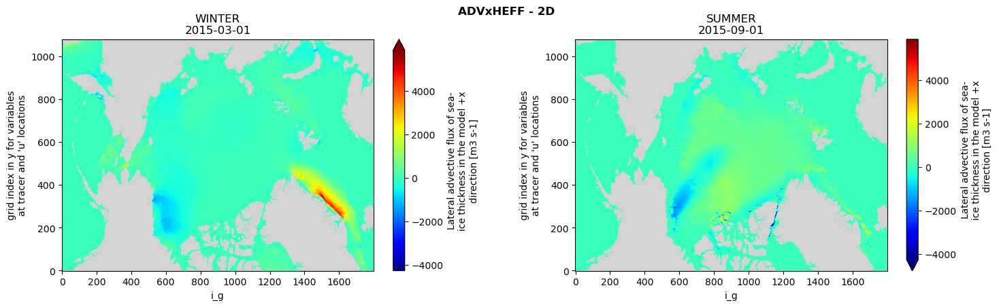

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, i_g: 1800)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    ADVxHEFF   (time, j, i_g) float64 16MB -0.0 -0.0 -0.0 -0.0 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      d8d95b70-eace-11ee-ab72-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T17:41:01
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...

In [43]:
plot_all_sassie_granules(['ADVxHEFF'], netcdf_dir, sassie_key, sassie_secret, "2015-03-01", "2015-09-01", depth_3d=0, vrange_same=True)


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




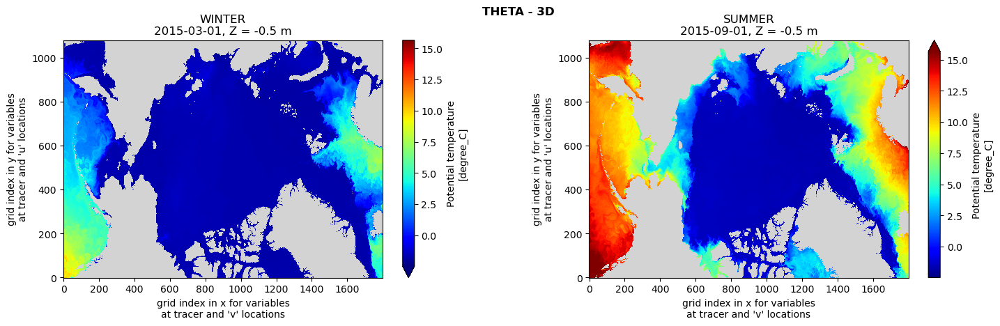

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    THETA      (time, k, j, i) float64 1GB ...
Attributes: (12/55)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    time_coverage_end:               2015-03-01T00:00:00
    time_coverage_start:             2015-03-02T00:00:00
    title:                           SASSIE Ocean Model THETA Parameter for t...
    uuid:                            77bcf8a8-e9ff-11ee-b5d0-067436d4d101
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-24T16:56:32

In [41]:
plot_all_sassie_granules(['THETA'], netcdf_dir, sassie_key, sassie_secret, "2015-03-01", "2015-09-01", depth_3d=0, vrange_same=True)

### run all variables


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVr_SLT_AVG_DAILY/ADVr_SLT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVr_SLT_AVG_DAILY/ADVr_SLT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVr_SLT_AVG_DAILY/ADVr_SLT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVr_SLT_AVG_DAILY/ADVr_SLT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc



Files for ADVr_SLT on 2015-03-01 or 2015-09-01 not found.


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVr_TH_AVG_DAILY/ADVr_TH_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVr_TH_AVG_DAILY/ADVr_TH_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVr_TH_AVG_DAILY/ADVr_TH_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080

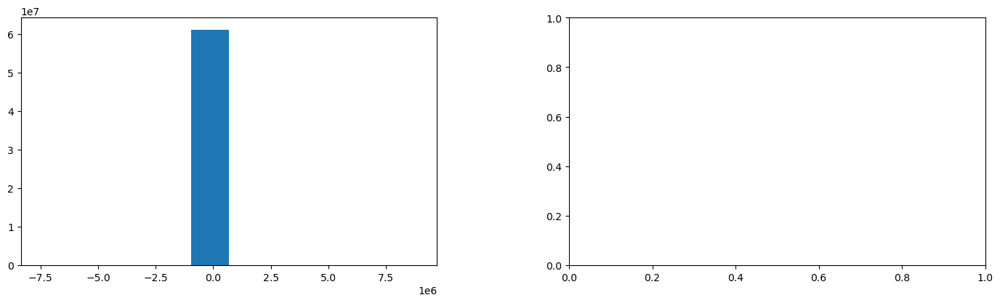

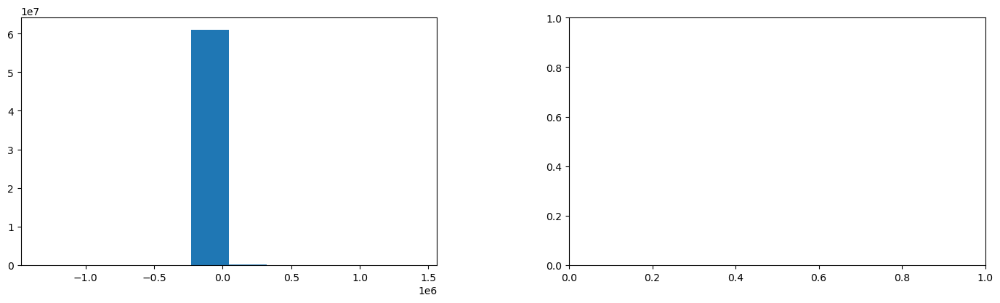

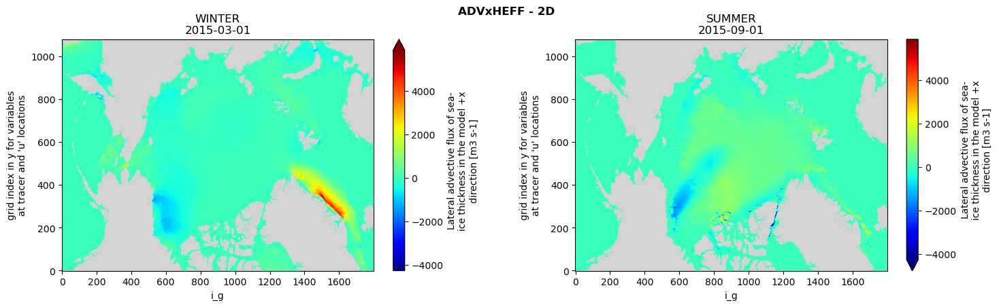

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, i_g: 1800)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    ADVxHEFF   (time, j, i_g) float64 16MB -0.0 -0.0 -0.0 -0.0 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      d8d95b70-eace-11ee-ab72-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T17:41:01
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVxSNOW_AVG_DAILY/ADVxSNOW_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVxSNOW_AVG_DAILY/ADVxSNOW_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVxSNOW_AVG_DAILY/ADVxSNOW_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVxSNOW_AVG_DAILY/ADVxSNOW_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




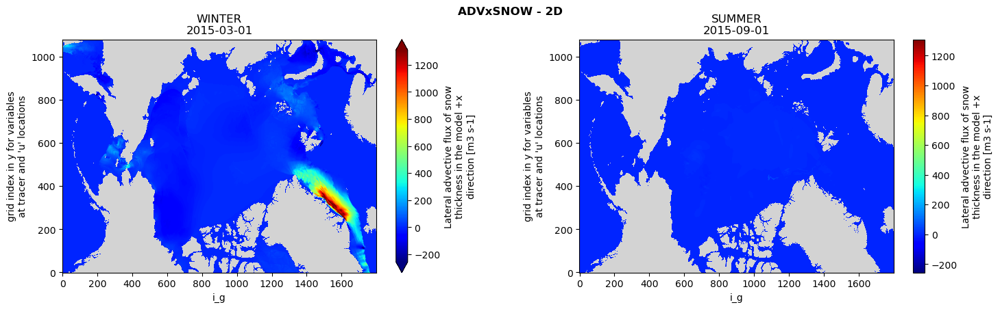

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, i_g: 1800)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    ADVxSNOW   (time, j, i_g) float64 16MB -0.0 -0.0 -0.0 -0.0 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      e3c0a76e-eace-11ee-ab72-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T17:41:20
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVx_SLT_AVG_DAILY/ADVx_SLT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVx_SLT_AVG_DAILY/ADVx_SLT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVx_SLT_AVG_DAILY/ADVx_SLT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVx_SLT_AVG_DAILY/ADVx_SLT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




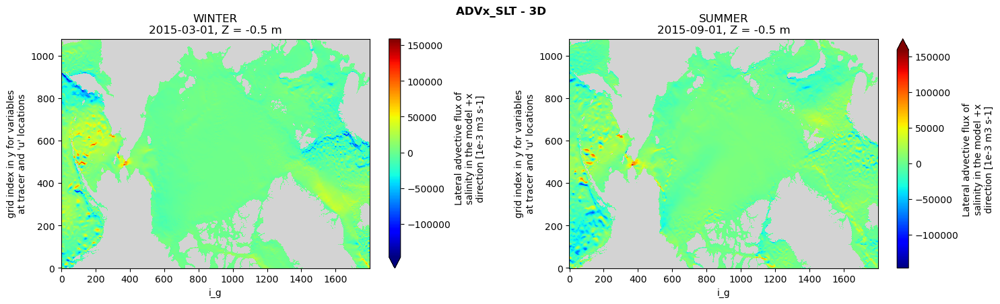

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2, i_g: 1800)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    ADVx_SLT   (time, k, j, i_g) float64 1GB ...
Attributes: (12/56)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    uuid:                            19a3b694-ea4a-11ee-810b-067436d4d101
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-25T01:50:47
    history:                         Initial release of the ECCO N1 Sassie Oc...
    metadata_link:                   https://cmr.earthdata.nasa.gov/search/co...
    NCO:                             netCDF Operators version 5.2.1 (Homepage...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVx_TH_AVG_DAILY/ADVx_TH_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVx_TH_AVG_DAILY/ADVx_TH_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVx_TH_AVG_DAILY/ADVx_TH_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVx_TH_AVG_DAILY/ADVx_TH_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




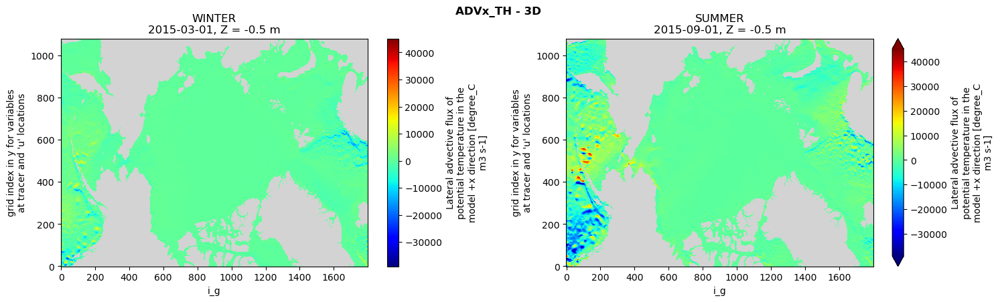

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2, i_g: 1800)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    ADVx_TH    (time, k, j, i_g) float64 1GB ...
Attributes: (12/56)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    uuid:                            1042a806-ea4c-11ee-810b-067436d4d101
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-25T02:04:50
    history:                         Initial release of the ECCO N1 Sassie Oc...
    metadata_link:                   https://cmr.earthdata.nasa.gov/search/co...
    NCO:                             netCDF Operators version 5.2.1 (Homepage...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVyHEFF_AVG_DAILY/ADVyHEFF_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVyHEFF_AVG_DAILY/ADVyHEFF_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVyHEFF_AVG_DAILY/ADVyHEFF_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVyHEFF_AVG_DAILY/ADVyHEFF_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




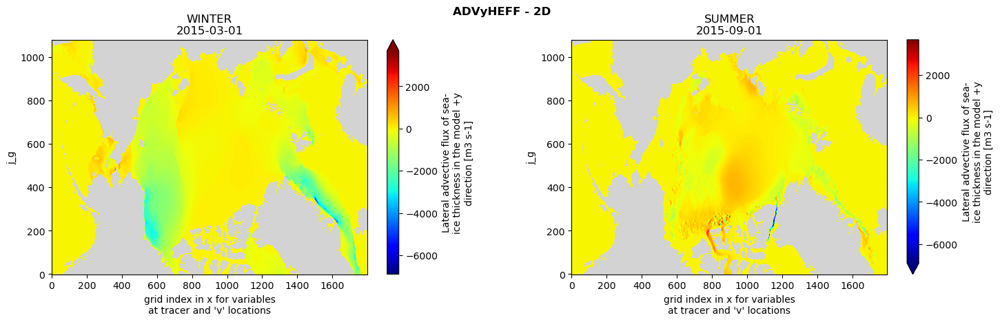

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, j_g: 1080)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    ADVyHEFF   (time, j_g, i) float64 16MB -0.0 -0.0 -0.0 -0.0 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      ee874a2c-eace-11ee-ab72-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T17:41:38
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVySNOW_AVG_DAILY/ADVySNOW_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVySNOW_AVG_DAILY/ADVySNOW_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVySNOW_AVG_DAILY/ADVySNOW_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVySNOW_AVG_DAILY/ADVySNOW_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




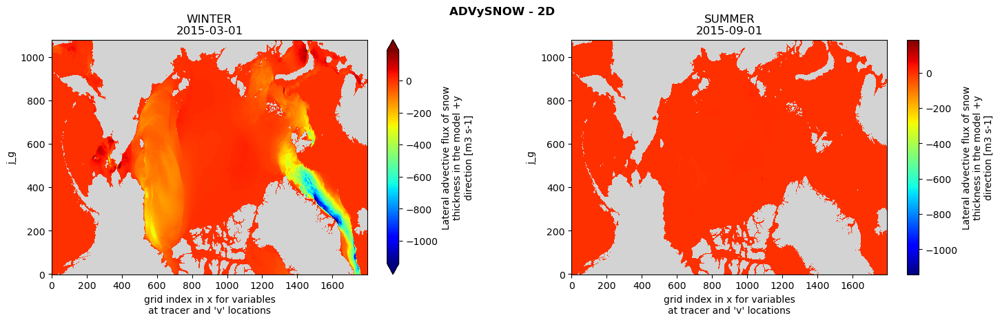

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, j_g: 1080)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    ADVySNOW   (time, j_g, i) float64 16MB -0.0 -0.0 -0.0 -0.0 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      f7739ca8-eace-11ee-ab72-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T17:41:53
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVy_SLT_AVG_DAILY/ADVy_SLT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVy_SLT_AVG_DAILY/ADVy_SLT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVy_SLT_AVG_DAILY/ADVy_SLT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVy_SLT_AVG_DAILY/ADVy_SLT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




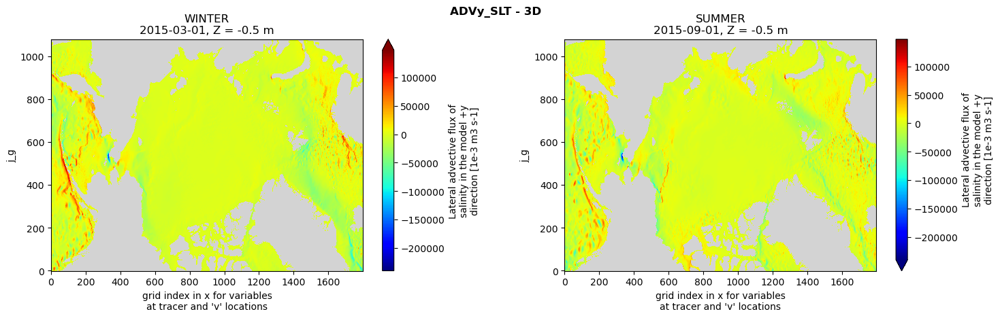

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2, j_g: 1080)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    ADVy_SLT   (time, k, j_g, i) float64 1GB ...
Attributes: (12/55)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    time_coverage_end:               2015-03-01T00:00:00
    time_coverage_start:             2015-03-02T00:00:00
    title:                           SASSIE Ocean Model ADVy_SLT Parameter fo...
    uuid:                            280db53c-ea4e-11ee-810b-067436d4d101
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-25T02:19:49


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVy_TH_AVG_DAILY/ADVy_TH_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVy_TH_AVG_DAILY/ADVy_TH_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVy_TH_AVG_DAILY/ADVy_TH_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ADVy_TH_AVG_DAILY/ADVy_TH_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




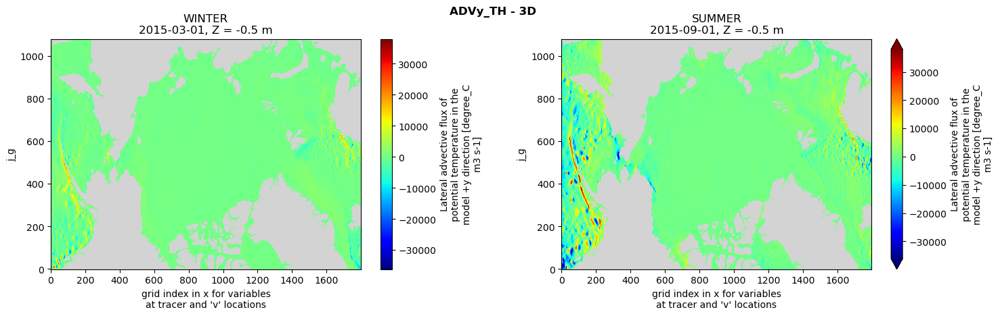

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2, j_g: 1080)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    ADVy_TH    (time, k, j_g, i) float64 1GB ...
Attributes: (12/56)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    uuid:                            779582ae-ea50-11ee-810b-067436d4d101
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-25T02:36:21
    history:                         Initial release of the ECCO N1 Sassie Oc...
    metadata_link:                   https://cmr.earthdata.nasa.gov/search/co...
    NCO:                             netCDF Operators version 5.2.1 (Homepage...


Files for DFrE_SLT on 2015-03-01 or 2015-09-01 not found.


Files for DFrE_TH on 2015-03-01 or 2015-09-01 not found.


Files for DFrI_SLT on 2015-03-01 or 2015-09-01 not found.


Files for DFrI_TH on 2015-03-01 or 2015-09-01 not found.


Files for DFxE_SLT on 2015-03-01 or 2015-09-01 not found.


Files for DFxE_TH on 2015-03-01 or 2015-09-01 not found.


Files for DFyE_SLT on 2015-03-01 or 2015-09-01 not found.


Files for DFyE_TH on 2015-03-01 or 2015-09-01 not found.


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ETAN_AVG_DAILY/ETAN_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ETAN_AVG_DAILY/ETAN_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ETAN_AVG_DAILY/ETAN_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/ETAN_AVG_DAILY/ETAN_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




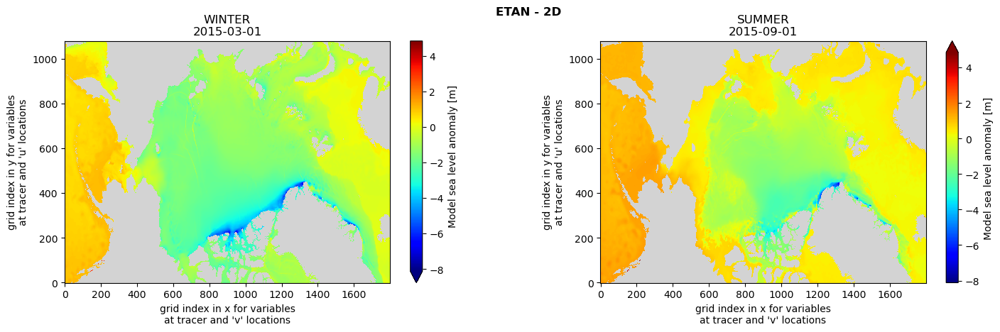

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    ETAN       (time, j, i) float64 16MB 1.037 1.041 1.043 1.045 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      657dbee8-e996-11ee-b0b4-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T04:24:25
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFaqh_AVG_DAILY/EXFaqh_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFaqh_AVG_DAILY/EXFaqh_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFaqh_AVG_DAILY/EXFaqh_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFaqh_AVG_DAILY/EXFaqh_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




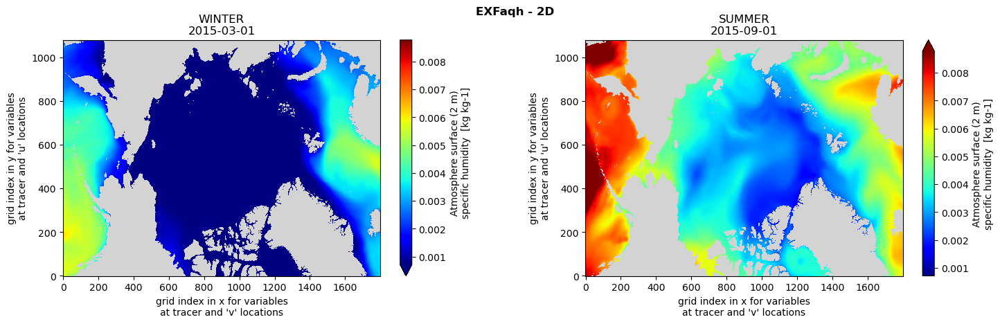

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFaqh     (time, j, i) float64 16MB 0.005582 0.005575 0.005569 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      e7f1c802-e9cc-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:54:36
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFatemp_AVG_DAILY/EXFatemp_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFatemp_AVG_DAILY/EXFatemp_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFatemp_AVG_DAILY/EXFatemp_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFatemp_AVG_DAILY/EXFatemp_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




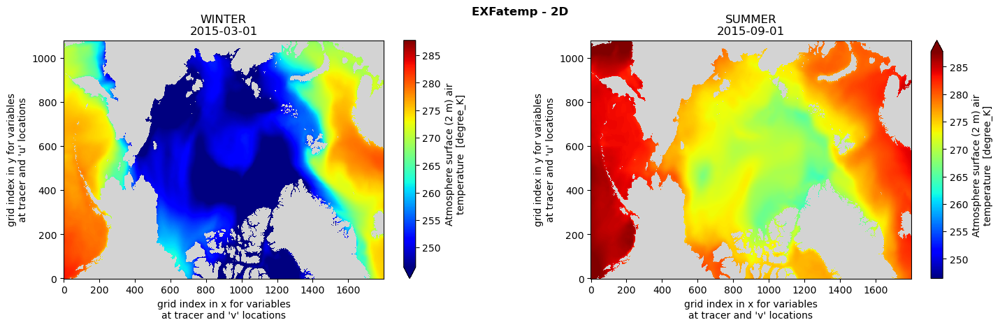

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFatemp   (time, j, i) float64 16MB 282.8 282.8 282.8 282.8 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      fd905e80-e9cc-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:55:13
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFempmr_AVG_DAILY/EXFempmr_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFempmr_AVG_DAILY/EXFempmr_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFempmr_AVG_DAILY/EXFempmr_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFempmr_AVG_DAILY/EXFempmr_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




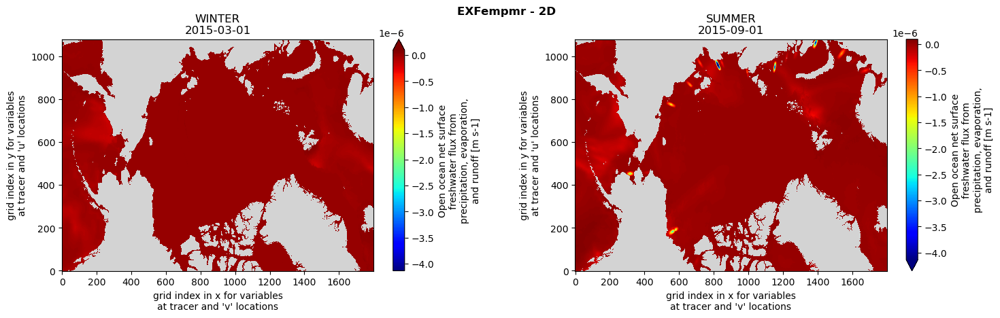

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFempmr   (time, j, i) float64 16MB -2.895e-08 -3.018e-08 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      089c3ba0-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:55:31
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFevap_AVG_DAILY/EXFevap_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFevap_AVG_DAILY/EXFevap_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFevap_AVG_DAILY/EXFevap_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFevap_AVG_DAILY/EXFevap_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




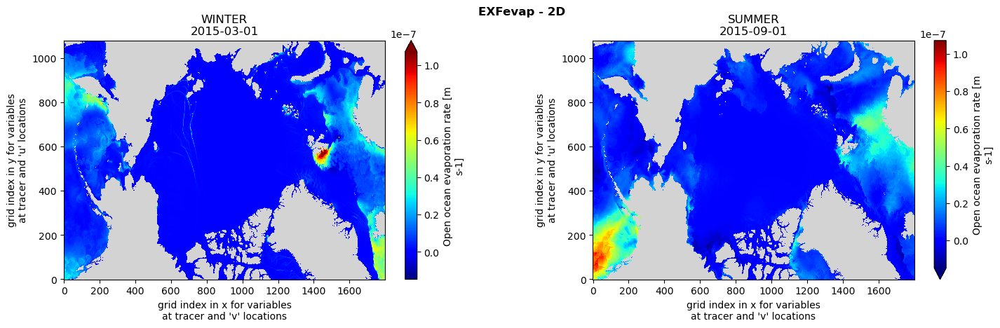

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFevap    (time, j, i) float64 16MB 3.238e-08 3.269e-08 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      12efe9d0-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:55:49
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFhl_AVG_DAILY/EXFhl_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFhl_AVG_DAILY/EXFhl_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFhl_AVG_DAILY/EXFhl_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFhl_AVG_DAILY/EXFhl_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




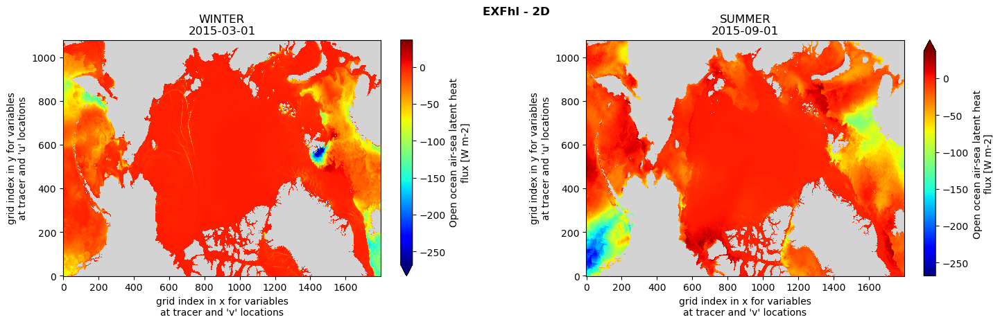

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFhl      (time, j, i) float64 16MB -80.94 -81.71 -82.16 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      726718b6-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:58:29
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFhs_AVG_DAILY/EXFhs_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFhs_AVG_DAILY/EXFhs_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFhs_AVG_DAILY/EXFhs_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFhs_AVG_DAILY/EXFhs_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




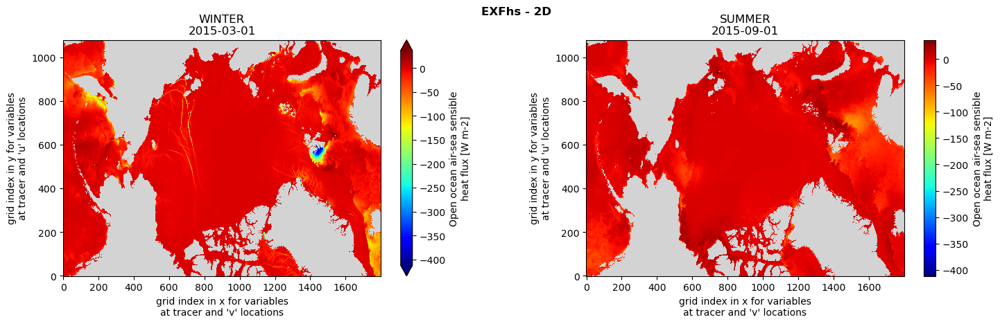

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFhs      (time, j, i) float64 16MB -7.303 -7.732 -7.939 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      9118ed02-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:59:20
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFlwdn_AVG_DAILY/EXFlwdn_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFlwdn_AVG_DAILY/EXFlwdn_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFlwdn_AVG_DAILY/EXFlwdn_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFlwdn_AVG_DAILY/EXFlwdn_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




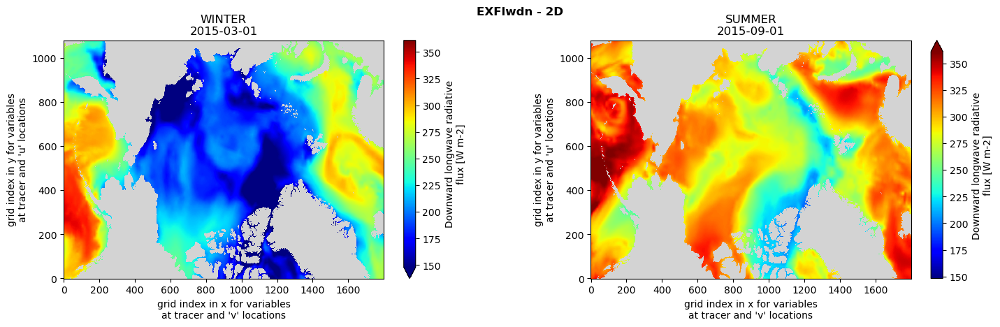

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFlwdn    (time, j, i) float64 16MB 289.6 289.6 289.7 289.7 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      aef9b86a-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T11:00:10
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFlwnet_AVG_DAILY/EXFlwnet_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFlwnet_AVG_DAILY/EXFlwnet_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFlwnet_AVG_DAILY/EXFlwnet_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFlwnet_AVG_DAILY/EXFlwnet_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




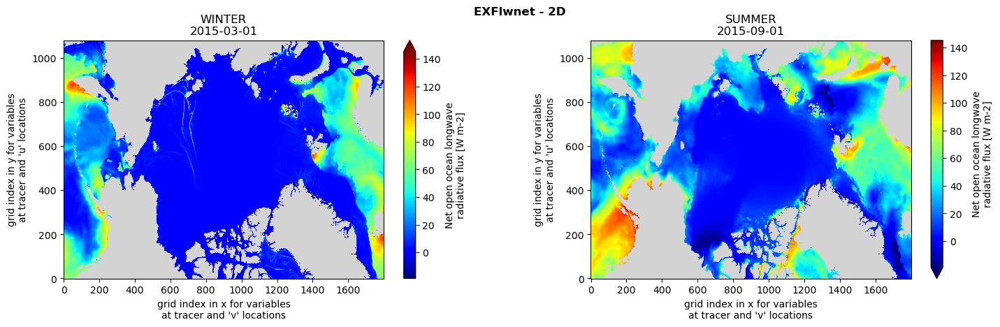

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFlwnet   (time, j, i) float64 16MB 73.58 73.59 73.54 73.45 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      b814c4e4-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T11:00:26
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFpreci_AVG_DAILY/EXFpreci_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFpreci_AVG_DAILY/EXFpreci_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFpreci_AVG_DAILY/EXFpreci_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFpreci_AVG_DAILY/EXFpreci_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




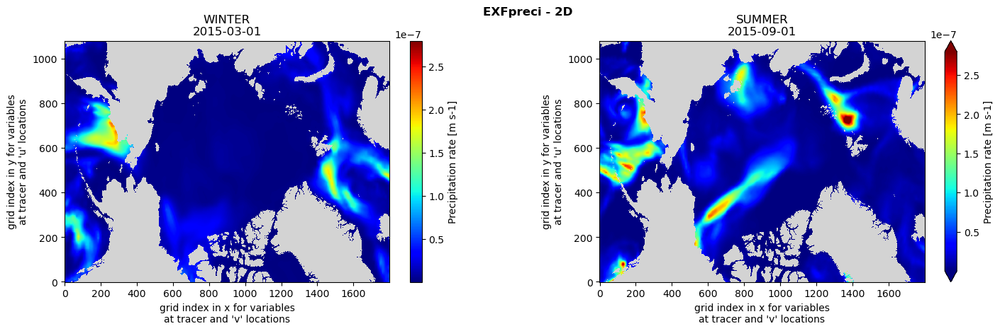

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFpreci   (time, j, i) float64 16MB 3.591e-08 3.67e-08 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      1d73a518-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:56:06
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFqnet_AVG_DAILY/EXFqnet_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFqnet_AVG_DAILY/EXFqnet_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFqnet_AVG_DAILY/EXFqnet_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFqnet_AVG_DAILY/EXFqnet_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




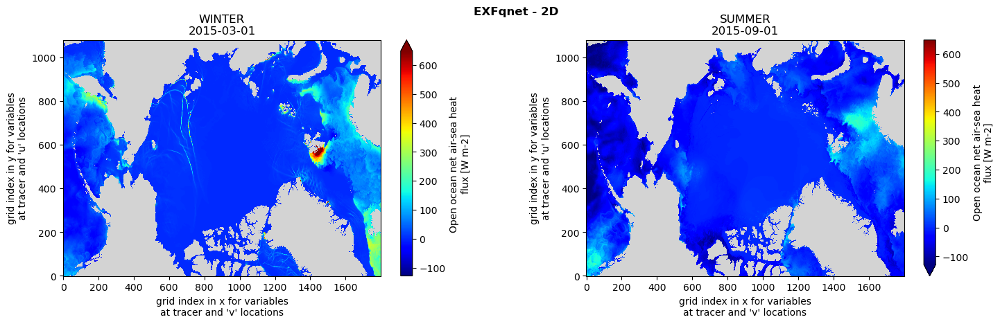

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFqnet    (time, j, i) float64 16MB 124.9 126.6 127.7 128.5 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      534d0d96-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:57:37
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFroff_AVG_DAILY/EXFroff_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFroff_AVG_DAILY/EXFroff_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFroff_AVG_DAILY/EXFroff_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFroff_AVG_DAILY/EXFroff_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




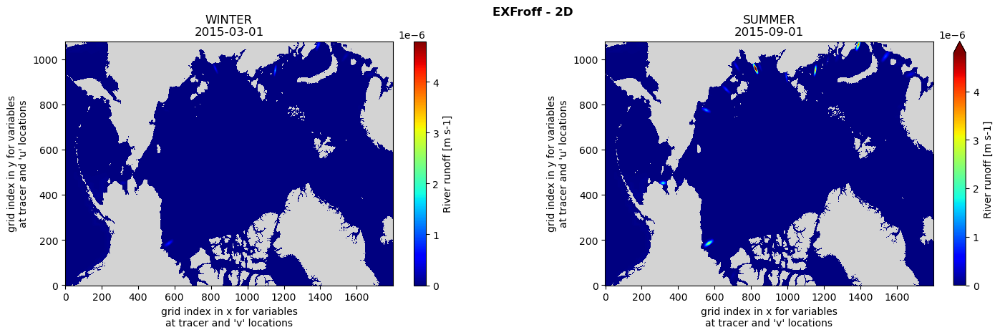

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFroff    (time, j, i) float64 16MB 2.543e-08 2.617e-08 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      3b9b92d0-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T10:56:57
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFswdn_AVG_DAILY/EXFswdn_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFswdn_AVG_DAILY/EXFswdn_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFswdn_AVG_DAILY/EXFswdn_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFswdn_AVG_DAILY/EXFswdn_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




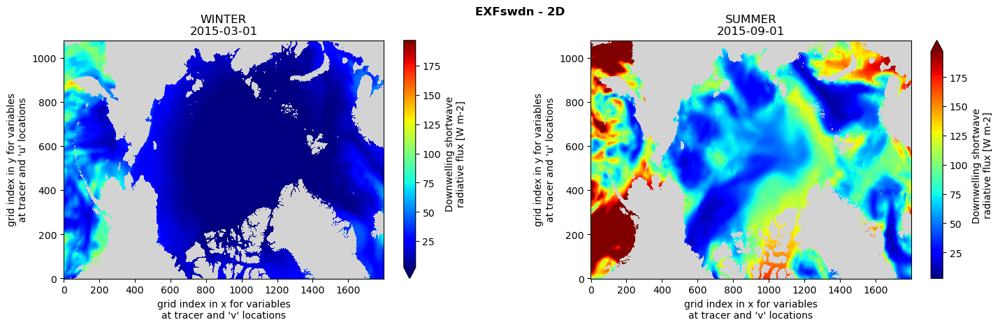

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFswdn    (time, j, i) float64 16MB 40.98 40.44 39.89 39.35 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      c1690582-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T11:00:41
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFswnet_AVG_DAILY/EXFswnet_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFswnet_AVG_DAILY/EXFswnet_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFswnet_AVG_DAILY/EXFswnet_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFswnet_AVG_DAILY/EXFswnet_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




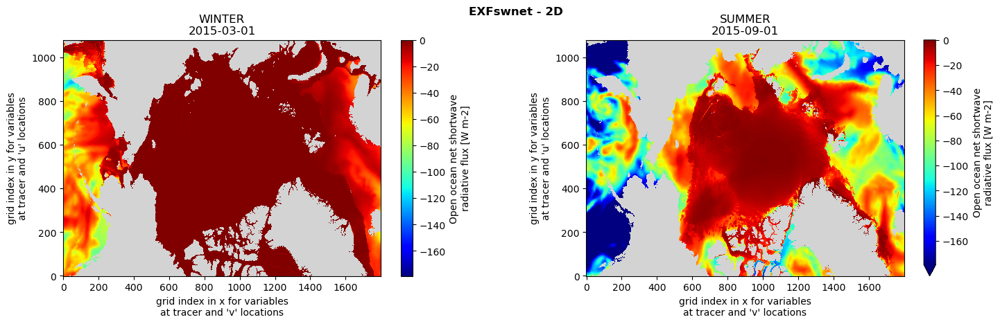

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    EXFswnet   (time, j, i) float64 16MB -36.93 -36.44 -35.95 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      cd68b8b4-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T11:01:01
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFtaux_AVG_DAILY/EXFtaux_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFtaux_AVG_DAILY/EXFtaux_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFtaux_AVG_DAILY/EXFtaux_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFtaux_AVG_DAILY/EXFtaux_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




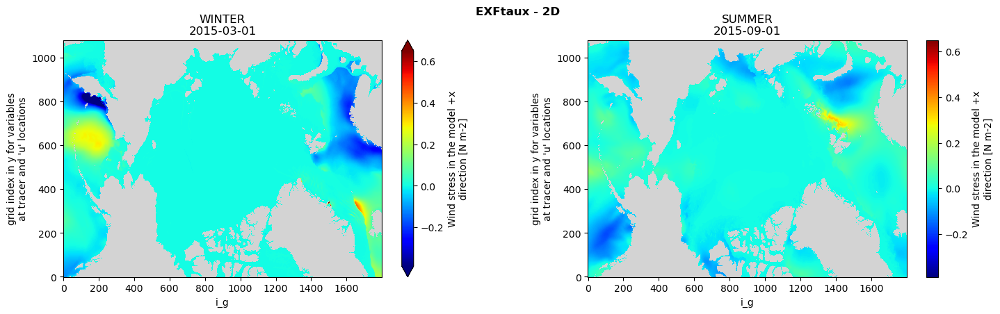

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, i_g: 1800)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    EXFtaux    (time, j, i_g) float64 16MB -0.1068 -0.1071 -0.1074 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      0b782e82-e9ce-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T11:02:46
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFtauy_AVG_DAILY/EXFtauy_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFtauy_AVG_DAILY/EXFtauy_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFtauy_AVG_DAILY/EXFtauy_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFtauy_AVG_DAILY/EXFtauy_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




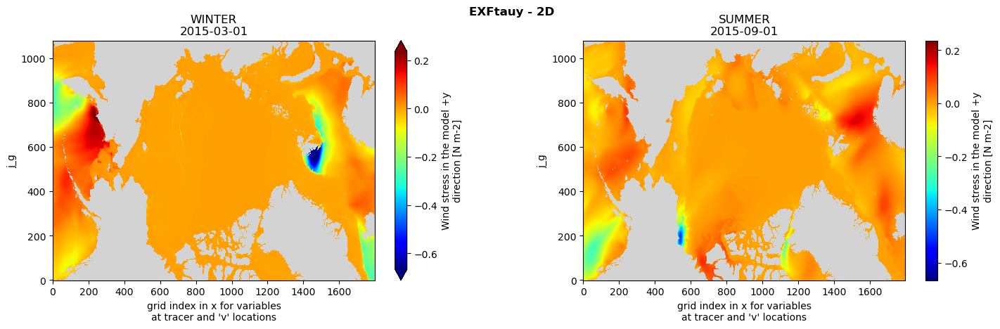

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, j_g: 1080)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    EXFtauy    (time, j_g, i) float64 16MB -0.04983 -0.05032 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      4baf02dc-e9ce-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T11:04:33
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFuwind_AVG_DAILY/EXFuwind_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFuwind_AVG_DAILY/EXFuwind_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFuwind_AVG_DAILY/EXFuwind_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFuwind_AVG_DAILY/EXFuwind_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




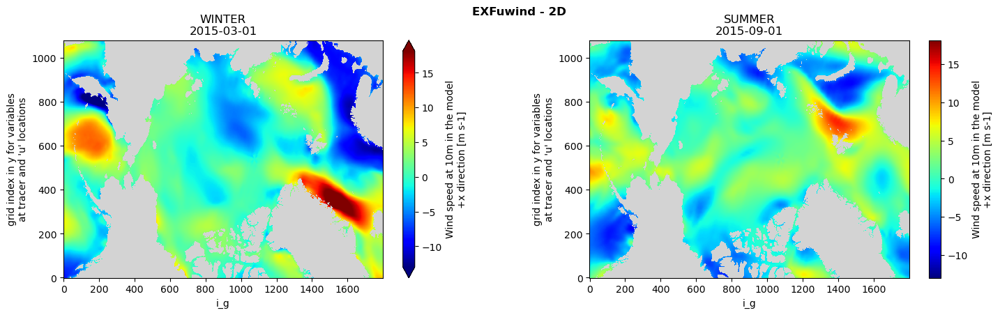

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, i_g: 1800)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    EXFuwind   (time, j, i_g) float64 16MB -8.23 -8.236 -8.241 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      ec425c90-e9cd-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T11:01:53
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFvwind_AVG_DAILY/EXFvwind_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFvwind_AVG_DAILY/EXFvwind_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFvwind_AVG_DAILY/EXFvwind_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/EXFvwind_AVG_DAILY/EXFvwind_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




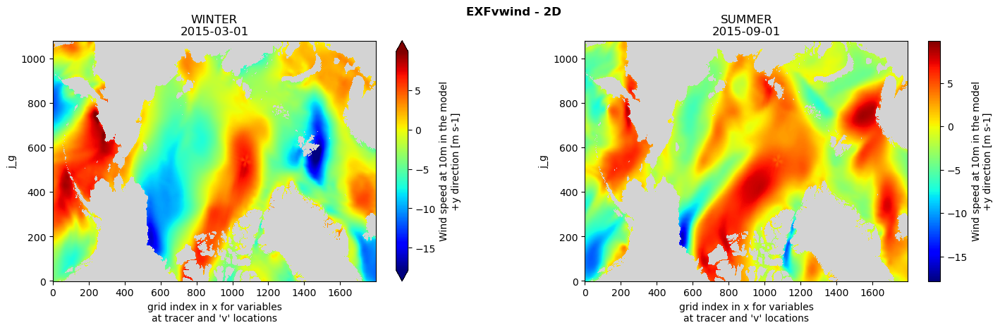

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, j_g: 1080)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    EXFvwind   (time, j_g, i) float64 16MB -3.746 -3.776 -3.804 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      2bb4ae78-e9ce-11ee-b6e3-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T11:03:40
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


Files for KPPdiffS on 2015-03-01 or 2015-09-01 not found.


Files for KPPdiffT on 2015-03-01 or 2015-09-01 not found.


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/KPPhbl_AVG_DAILY/KPPhbl_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/KPPhbl_AVG_DAILY/KPPhbl_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/KPPhbl_AVG_DAILY/KPPhbl_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/KPPhbl_AVG_DAILY/KPPhbl_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




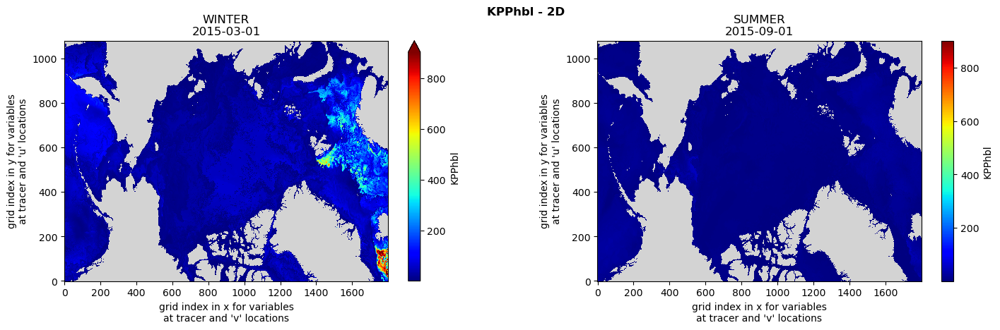

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    KPPhbl     (time, j, i) float64 16MB 46.59 45.09 44.48 46.36 ... nan nan nan
Attributes: (12/50)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    time_coverage_end:         2015-03-01T00:00:00
    time_coverage_start:       2015-03-02T00:00:00
    title:                     SASSIE Ocean Model KPPhbl Parameter for the La...
    uuid:                      83f0e82e-ef94-11ee-945c-0604868e061f
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-31T19:26:04


Files for KPPviscA on 2015-03-01 or 2015-09-01 not found.


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/PHIBOT_AVG_DAILY/PHIBOT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/PHIBOT_AVG_DAILY/PHIBOT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/PHIBOT_AVG_DAILY/PHIBOT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/PHIBOT_AVG_DAILY/PHIBOT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




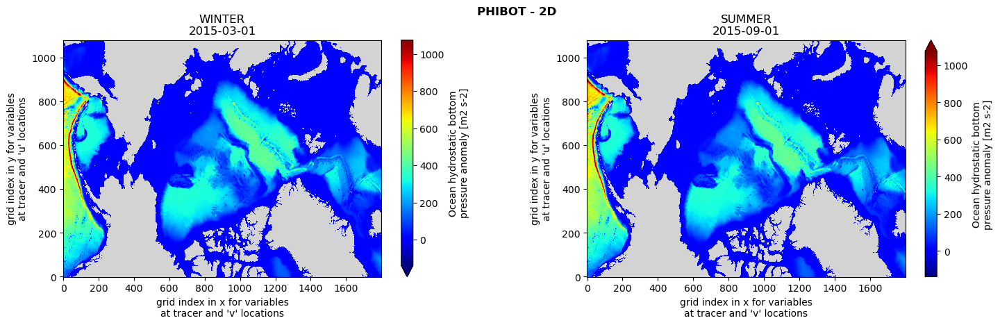

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    PHIBOT     (time, j, i) float64 16MB 145.3 146.3 143.0 145.0 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      6f9fa53a-e996-11ee-b0b4-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T04:24:42
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


Files for PHIHYD on 2015-03-01 or 2015-09-01 not found.


Files for PHIHYDcR on 2015-03-01 or 2015-09-01 not found.


Files for RHOAnoma on 2015-03-01 or 2015-09-01 not found.


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SALT_AVG_DAILY/SALT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SALT_AVG_DAILY/SALT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SALT_AVG_DAILY/SALT_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SALT_AVG_DAILY/SALT_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




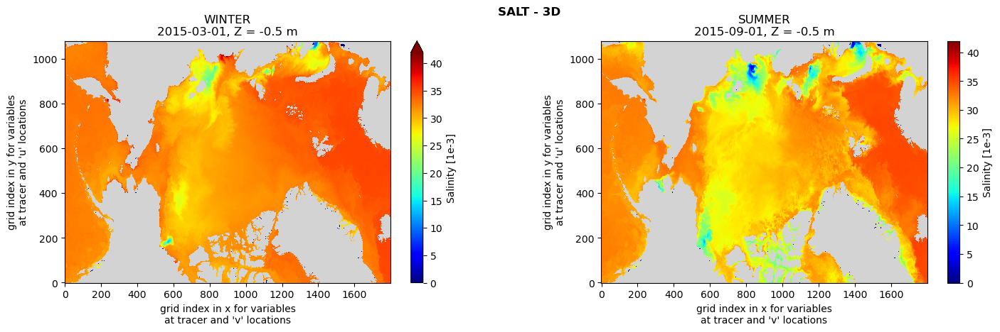

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    SALT       (time, k, j, i) float64 1GB ...
Attributes: (12/56)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    uuid:                            05fe32be-e9fe-11ee-b5d0-067436d4d101
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-24T16:46:12
    history:                         Initial release of the ECCO N1 Sassie Oc...
    metadata_link:                   https://cmr.earthdata.nasa.gov/search/co...
    NCO:                             netCDF Operators version 5.2.1 (Homepage...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SFLUX_AVG_DAILY/SFLUX_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SFLUX_AVG_DAILY/SFLUX_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SFLUX_AVG_DAILY/SFLUX_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SFLUX_AVG_DAILY/SFLUX_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




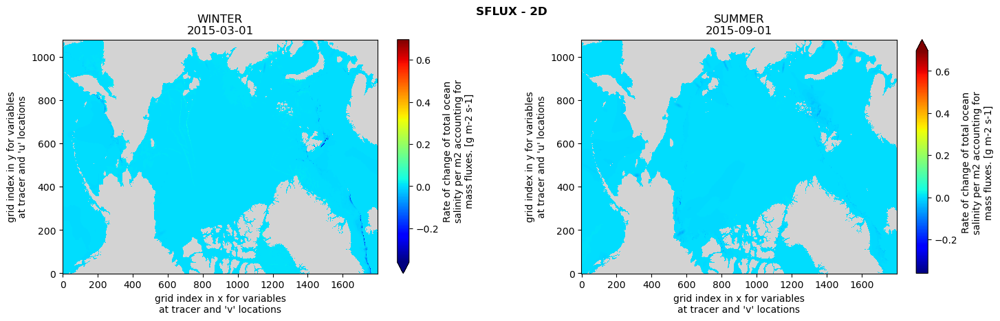

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    SFLUX      (time, j, i) float64 16MB -0.0009275 -0.0009669 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      2c24ac62-ea20-11ee-87ce-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T20:50:39
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIarea_AVG_DAILY/SIarea_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIarea_AVG_DAILY/SIarea_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIarea_AVG_DAILY/SIarea_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIarea_AVG_DAILY/SIarea_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




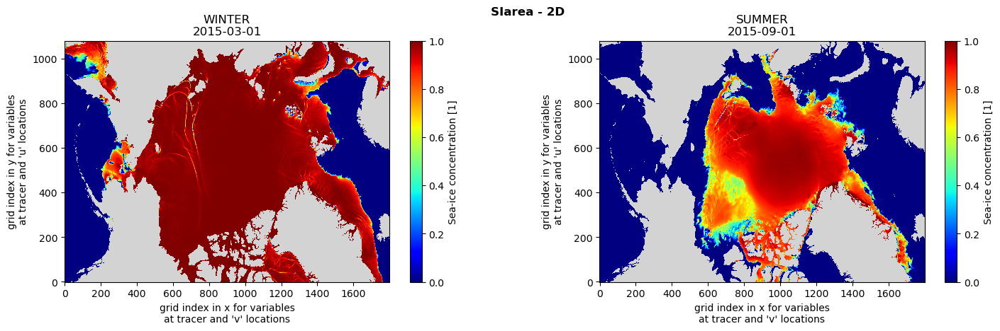

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    SIarea     (time, j, i) float64 16MB 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      54765482-ea51-11ee-bb1f-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T02:42:32
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIatmFW_AVG_DAILY/SIatmFW_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIatmFW_AVG_DAILY/SIatmFW_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIatmFW_AVG_DAILY/SIatmFW_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIatmFW_AVG_DAILY/SIatmFW_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




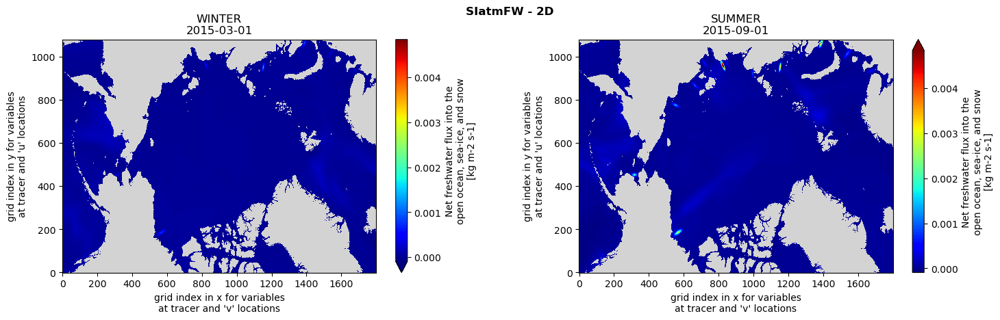

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    SIatmFW    (time, j, i) float64 16MB 2.894e-05 3.017e-05 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      51befaf6-ea41-11ee-838e-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T00:47:56
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIatmQnt_AVG_DAILY/SIatmQnt_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIatmQnt_AVG_DAILY/SIatmQnt_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIatmQnt_AVG_DAILY/SIatmQnt_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIatmQnt_AVG_DAILY/SIatmQnt_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




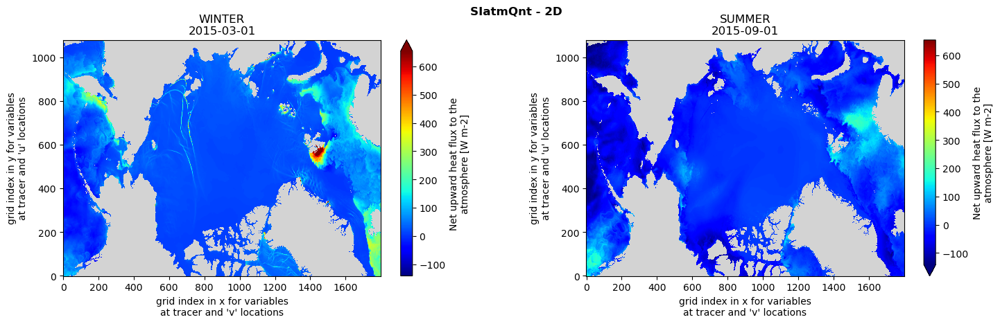

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    SIatmQnt   (time, j, i) float64 16MB 123.9 125.6 126.6 127.3 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      71ee5be6-ea41-11ee-838e-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T00:48:50
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIheff_AVG_DAILY/SIheff_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIheff_AVG_DAILY/SIheff_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIheff_AVG_DAILY/SIheff_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIheff_AVG_DAILY/SIheff_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




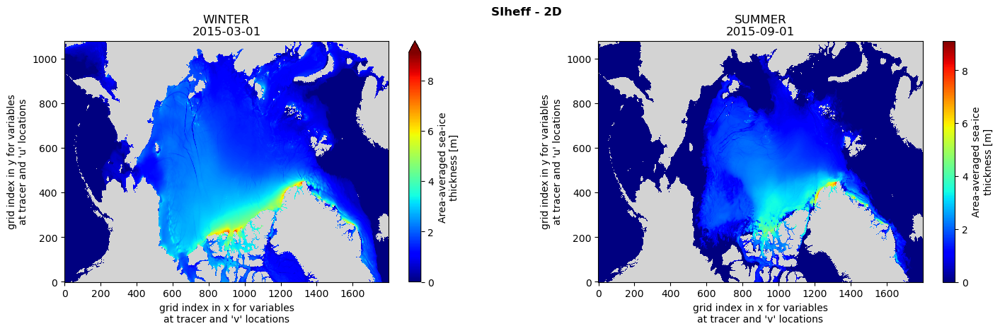

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    SIheff     (time, j, i) float64 16MB 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      719c8f4a-ea51-11ee-bb1f-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T02:43:21
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIhsnow_AVG_DAILY/SIhsnow_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIhsnow_AVG_DAILY/SIhsnow_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIhsnow_AVG_DAILY/SIhsnow_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIhsnow_AVG_DAILY/SIhsnow_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




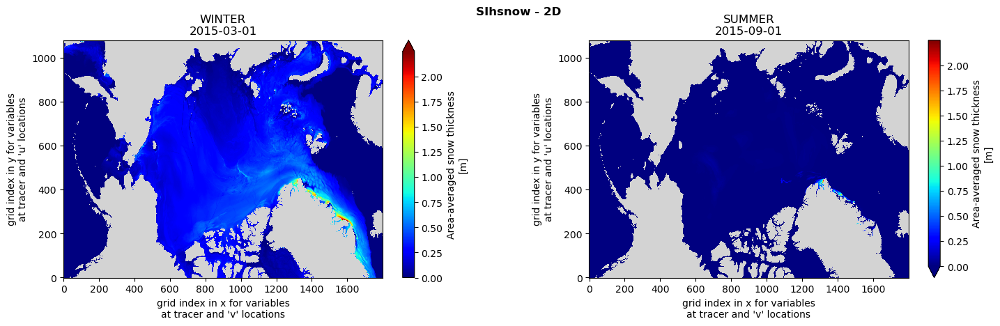

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    SIhsnow    (time, j, i) float64 16MB 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      8e83de1a-ea51-11ee-bb1f-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T02:44:09
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIuice_AVG_DAILY/SIuice_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIuice_AVG_DAILY/SIuice_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIuice_AVG_DAILY/SIuice_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIuice_AVG_DAILY/SIuice_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




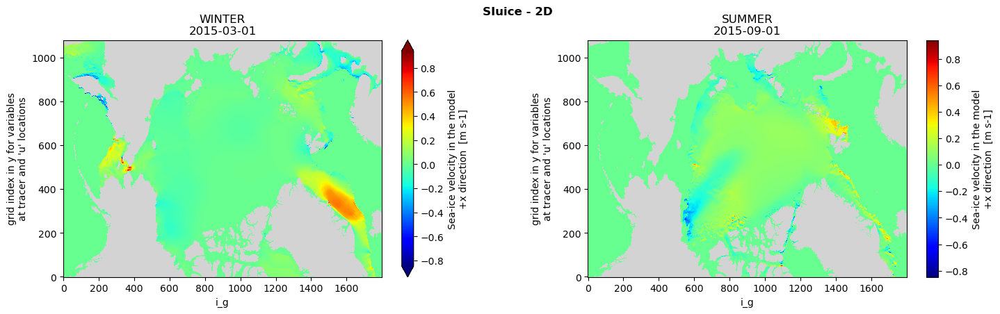

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, i_g: 1800)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    SIuice     (time, j, i_g) float64 16MB -0.0 -0.0 -0.0 -0.0 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      0e3f33fa-ea5e-11ee-8c2f-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T04:13:38
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIvice_AVG_DAILY/SIvice_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIvice_AVG_DAILY/SIvice_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIvice_AVG_DAILY/SIvice_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/SIvice_AVG_DAILY/SIvice_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




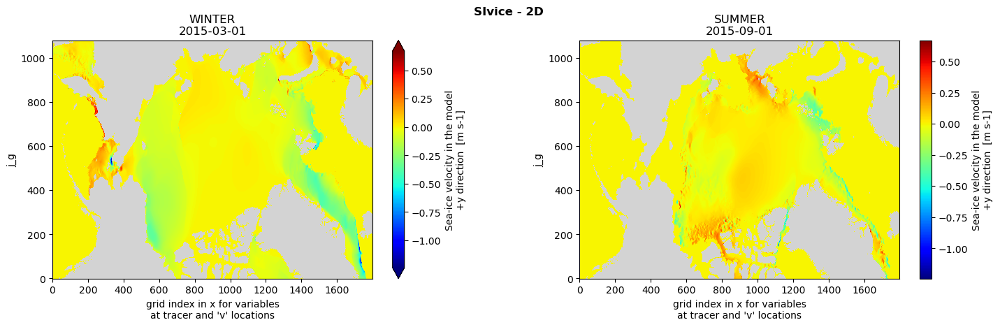

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, j_g: 1080)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    SIvice     (time, j_g, i) float64 16MB -0.0 -0.0 -0.0 -0.0 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      25525eb4-ea5e-11ee-8c2f-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-25T04:14:16
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/TFLUX_AVG_DAILY/TFLUX_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/TFLUX_AVG_DAILY/TFLUX_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/TFLUX_AVG_DAILY/TFLUX_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/TFLUX_AVG_DAILY/TFLUX_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




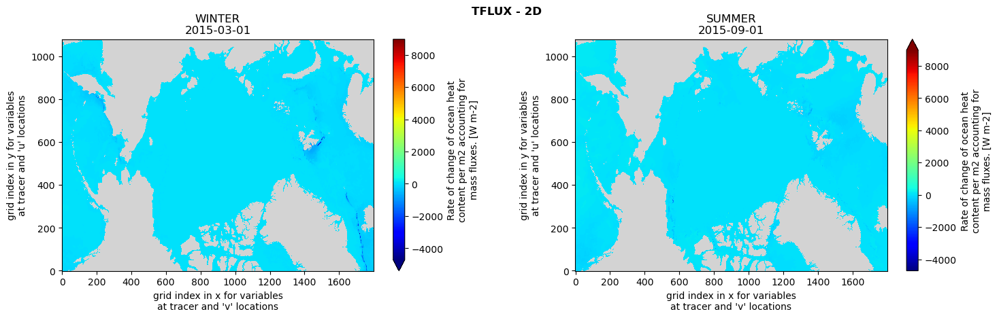

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    TFLUX      (time, j, i) float64 16MB -125.1 -126.8 -127.9 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      3640f4d0-ea20-11ee-87ce-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T20:50:56
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/THETA_AVG_DAILY/THETA_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




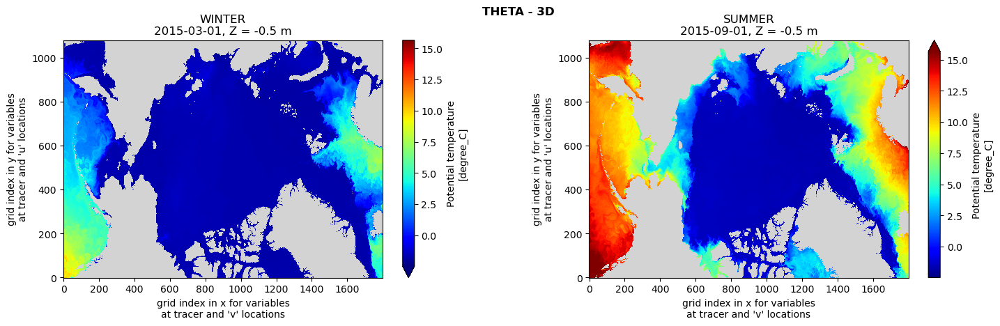

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    THETA      (time, k, j, i) float64 1GB ...
Attributes: (12/55)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    time_coverage_end:               2015-03-01T00:00:00
    time_coverage_start:             2015-03-02T00:00:00
    title:                           SASSIE Ocean Model THETA Parameter for t...
    uuid:                            77bcf8a8-e9ff-11ee-b5d0-067436d4d101
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-24T16:56:32


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/UVEL_AVG_DAILY/UVEL_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/UVEL_AVG_DAILY/UVEL_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/UVEL_AVG_DAILY/UVEL_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/UVEL_AVG_DAILY/UVEL_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




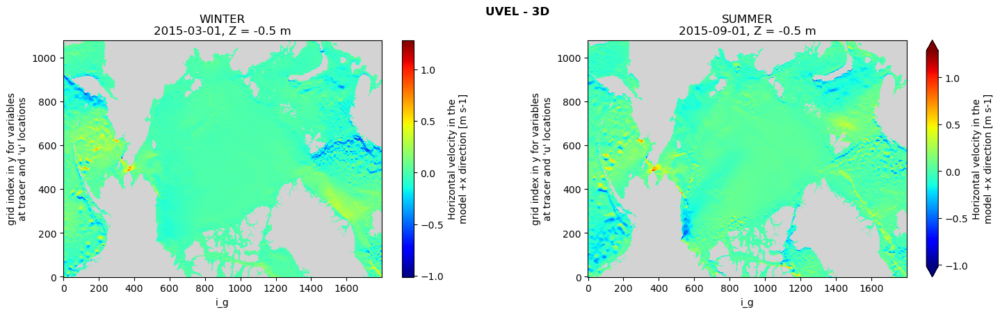

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2, i_g: 1800)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    UVEL       (time, k, j, i_g) float64 1GB ...
Attributes: (12/56)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    uuid:                            192d2036-ea4c-11ee-afc6-0604868e061f
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-25T02:05:05
    history:                         Initial release of the ECCO N1 Sassie Oc...
    metadata_link:                   https://cmr.earthdata.nasa.gov/search/co...
    NCO:                             netCDF Operators version 5.2.1 (Homepage...


Files for UVELMASS on 2015-03-01 or 2015-09-01 not found.


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/VVEL_AVG_DAILY/VVEL_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/VVEL_AVG_DAILY/VVEL_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/VVEL_AVG_DAILY/VVEL_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/VVEL_AVG_DAILY/VVEL_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




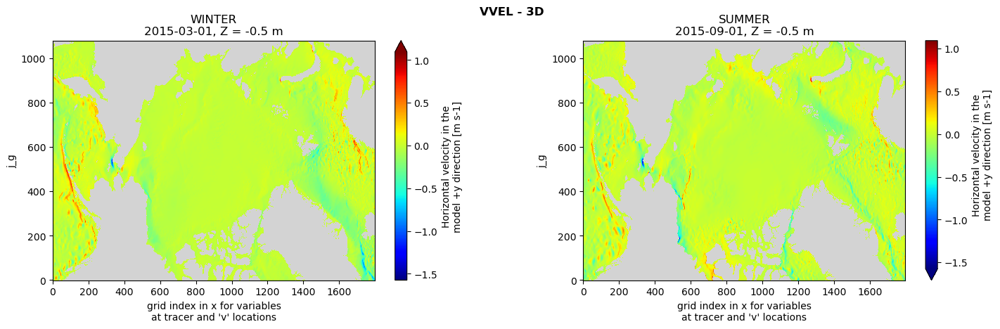

Printing example netCDF contents...



<xarray.Dataset> Size: 1GB
Dimensions:    (time: 1, k: 90, j: 1080, i: 1800, k_u: 90, k_l: 90, k_p1: 91,
                nv: 2, j_g: 1080)
Coordinates: (12/14)
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * k          (k) int32 360B 0 1 2 3 4 5 6 7 8 9 ... 81 82 83 84 85 86 87 88 89
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
  * k_u        (k_u) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
  * k_l        (k_l) int32 360B 0 1 2 3 4 5 6 7 8 ... 81 82 83 84 85 86 87 88 89
    ...         ...
    YC         (j, i) float32 8MB ...
    Z          (k) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
    Zu         (k_u) float32 360B ...
    Zl         (k_l) float32 360B ...
    Zp1        (k_p1) float32 364B ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    VVEL       (time, k, j_g, i) float64 1GB ...
Attributes: (12/56)
    acknowledgement:                 This research was carried out by the Jet...
    author:                          Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:                   Grid
    Conventions:                     CF-1.8, ACDD-1.3
    creator_email:                   ecco-group@mit.edu
    creator_institution:             NASA Jet Propulsion Laboratory (JPL)
    ...                              ...
    uuid:                            90379bf0-ea4e-11ee-afc6-0604868e061f
    comment:                         SASSIE llc1080 V1R1 fields are consolida...
    date_modified:                   2024-03-25T02:22:44
    history:                         Initial release of the ECCO N1 Sassie Oc...
    metadata_link:                   https://cmr.earthdata.nasa.gov/search/co...
    NCO:                             netCDF Operators version 5.2.1 (Homepage...


Files for VVELMASS on 2015-03-01 or 2015-09-01 not found.


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/WVEL_AVG_DAILY/WVEL_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/WVEL_AVG_DAILY/WVEL_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 3D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/WVEL_AVG_DAILY/WVEL_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/WVEL_AVG_DAILY/WVEL_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc



Files for WVEL on 2015-03-01 or 2015-09-01 not found.


Files for WVELMASS on 2015-03-01 or 2015-09-01 not found.


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceFWflx_AVG_DAILY/oceFWflx_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceFWflx_AVG_DAILY/oceFWflx_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model

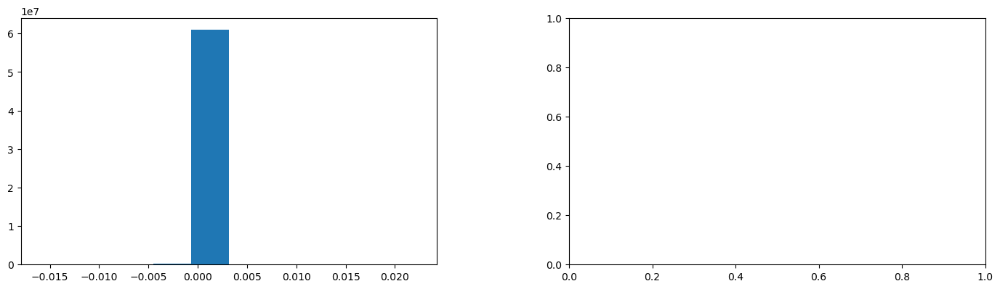

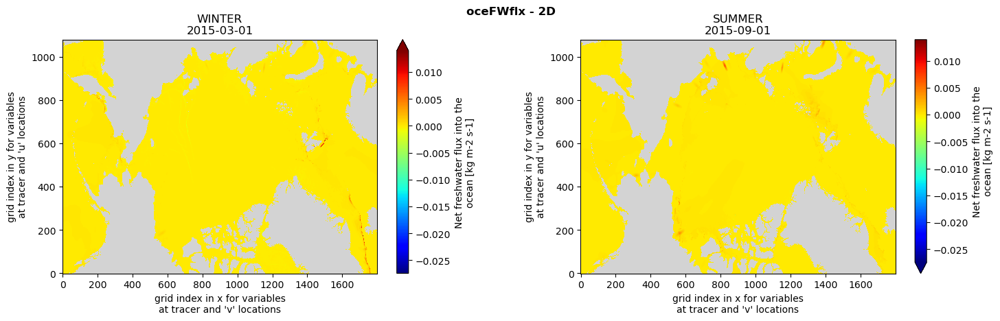

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    oceFWflx   (time, j, i) float64 16MB 2.894e-05 3.017e-05 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      b27ae796-ea1f-11ee-87ce-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T20:47:15
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceQnet_AVG_DAILY/oceQnet_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceQnet_AVG_DAILY/oceQnet_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceQnet_AVG_DAILY/oceQnet_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceQnet_AVG_DAILY/oceQnet_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




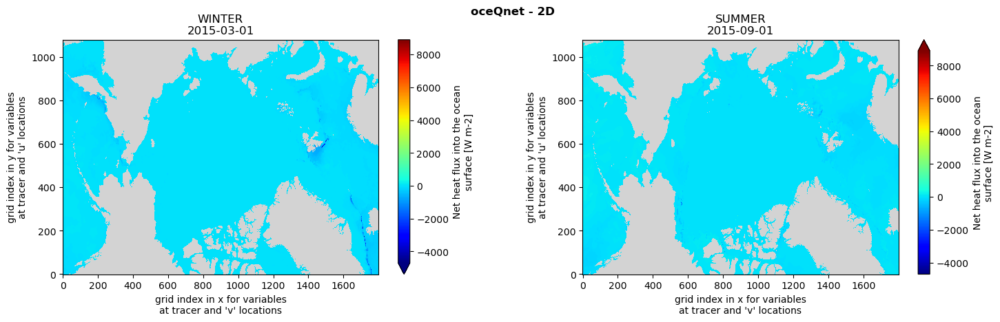

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    oceQnet    (time, j, i) float64 16MB -123.9 -125.6 -126.6 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      d334d91a-ea1f-11ee-87ce-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T20:48:10
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceQsw_AVG_DAILY/oceQsw_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceQsw_AVG_DAILY/oceQsw_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceQsw_AVG_DAILY/oceQsw_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceQsw_AVG_DAILY/oceQsw_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




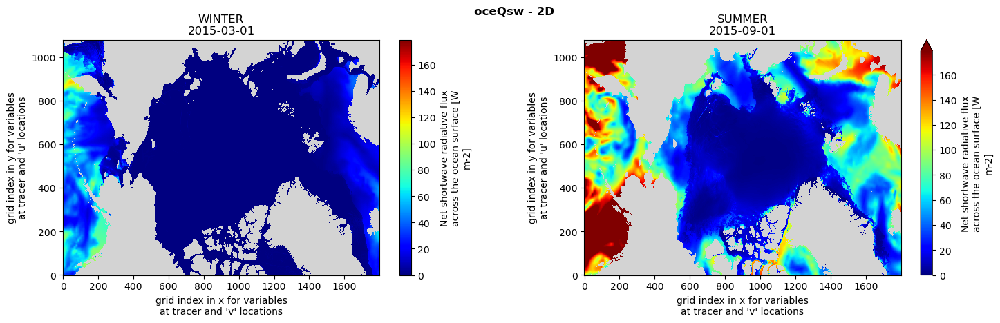

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    oceQsw     (time, j, i) float64 16MB 36.93 36.44 35.95 35.45 ... nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      f51e5fb0-ea1f-11ee-87ce-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T20:49:07
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceTAUX_AVG_DAILY/oceTAUX_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceTAUX_AVG_DAILY/oceTAUX_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceTAUX_AVG_DAILY/oceTAUX_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceTAUX_AVG_DAILY/oceTAUX_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




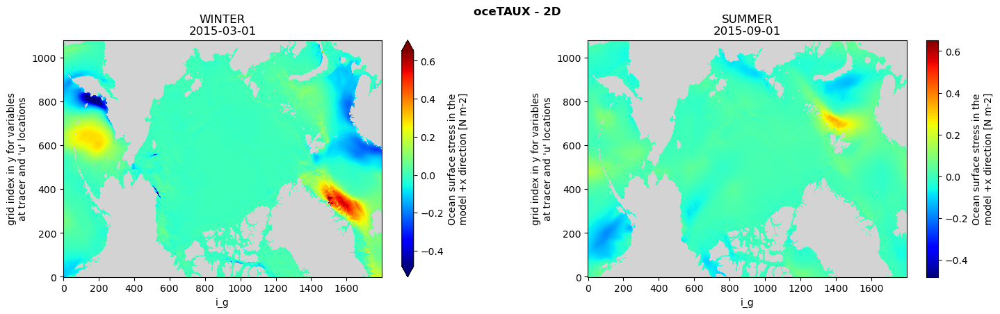

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, i_g: 1800)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, i_g
Data variables:
    oceTAUX    (time, j, i_g) float64 16MB -0.1069 -0.1073 -0.1075 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      1218b598-ea20-11ee-87ce-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T20:49:55
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceTAUY_AVG_DAILY/oceTAUY_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceTAUY_AVG_DAILY/oceTAUY_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceTAUY_AVG_DAILY/oceTAUY_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/oceTAUY_AVG_DAILY/oceTAUY_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




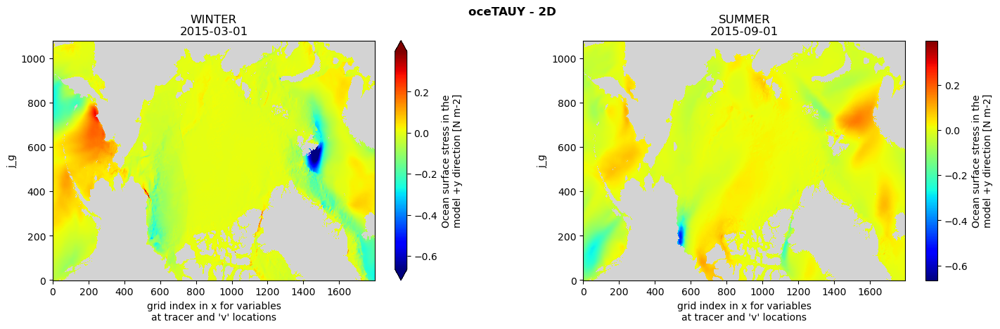

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2, j_g: 1080)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv, j_g
Data variables:
    oceTAUY    (time, j_g, i) float64 16MB -0.05001 -0.05045 ... nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      22448d20-ea20-11ee-87ce-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T20:50:22
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...


as urls
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/sIceLoad_AVG_DAILY/sIceLoad_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc']
['s3://podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/sIceLoad_AVG_DAILY/sIceLoad_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc']

plotting 2D var...
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/sIceLoad_AVG_DAILY/sIceLoad_day_mean_2015-03-01_ECCO_SASSIE_V1_HH_llc1080.nc
podaac-dev-sassie/ECCO_model/N1/V1/HH/NETCDF/sIceLoad_AVG_DAILY/sIceLoad_day_mean_2015-09-01_ECCO_SASSIE_V1_HH_llc1080.nc




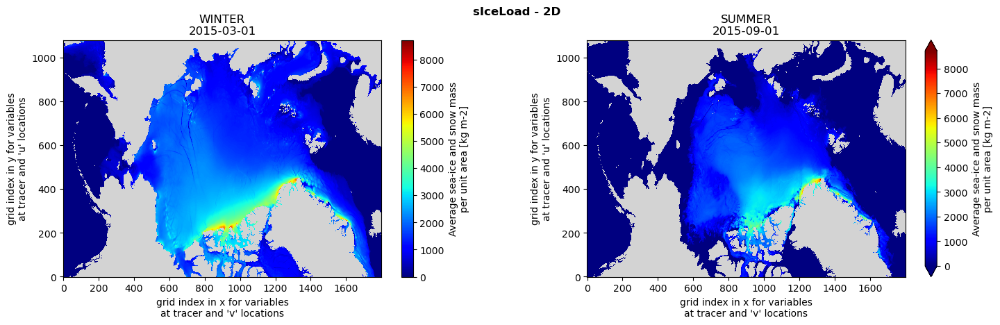

Printing example netCDF contents...



<xarray.Dataset> Size: 31MB
Dimensions:    (time: 1, j: 1080, i: 1800, nv: 2)
Coordinates:
  * time       (time) datetime64[ns] 8B 2015-03-01T12:00:00
  * j          (j) int32 4kB 0 1 2 3 4 5 6 ... 1074 1075 1076 1077 1078 1079
  * i          (i) int32 7kB 0 1 2 3 4 5 6 ... 1794 1795 1796 1797 1798 1799
    XC         (j, i) float32 8MB ...
    YC         (j, i) float32 8MB ...
    time_bnds  (time, nv) datetime64[ns] 16B ...
Dimensions without coordinates: nv
Data variables:
    sIceLoad   (time, j, i) float64 16MB 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
Attributes: (12/51)
    acknowledgement:           This research was carried out by the Jet Propu...
    author:                    Mike Wood, Marie Zahn, and Ian Fenty
    cdm_data_type:             Grid
    Conventions:               CF-1.8, ACDD-1.3
    creator_email:             ecco-group@mit.edu
    creator_institution:       NASA Jet Propulsion Laboratory (JPL)
    ...                        ...
    uuid:                      7a702494-e996-11ee-b0b4-06f6cde23aa5
    comment:                   SASSIE llc1080 V1R1 fields are consolidated on...
    date_modified:             2024-03-24T04:25:00
    history:                   Initial release of the ECCO N1 Sassie Ocean-Se...
    metadata_link:             https://cmr.earthdata.nasa.gov/search/collecti...
    NCO:                       netCDF Operators version 5.2.1 (Homepage = htt...

In [42]:
plot_all_sassie_granules(fields_all, netcdf_dir, sassie_key, sassie_secret, "2015-03-01", "2015-09-01", depth_3d=0, vrange_same=True)